# Task 1 - Graph Analysis

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from tqdm import tqdm

data_path = '../data/countries.csv'
countries_df = pd.read_csv(data_path)

print(countries_df)
print("Countries data shape:", countries_df.shape)

cities_df = pd.read_csv('../data/cities.csv')
city_names = cities_df['city'].str.upper().tolist()

print(cities_df)
print("Cities data shape:", cities_df.shape)
print(len(city_names))


                  Name Code
0          Afghanistan   AF
1        Åland Islands   AX
2              Albania   AL
3              Algeria   DZ
4       American Samoa   AS
..                 ...  ...
244  Wallis and Futuna   WF
245     Western Sahara   EH
246              Yemen   YE
247             Zambia   ZM
248           Zimbabwe   ZW

[249 rows x 2 columns]
Countries data shape: (249, 2)
     population         city     country  growthRate type  rank
0      37115000        Tokyo       Japan     -0.0021    w     1
1      33807400        Delhi       India      0.0263    w     2
2      29867900     Shanghai       China      0.0225    w     3
3      23935700        Dhaka  Bangladesh      0.0313    w     4
4      22806700    Sao Paulo      Brazil      0.0083    w     5
..          ...          ...         ...         ...  ...   ...
497     1173100  Krasnoyarsk      Russia      0.0054    w   498
498     1160840     Xinxiang       China      0.0177    w   499
499     1159370     Siliguri     

## Creating Atlas Graph

In [5]:
# create an edge from node A to node B if the last letter of A equals the first letter of B.
def create_atlas_graph(places):
    G = nx.DiGraph()
    for place in places:
        G.add_node(place)
    
    # add directed edges based on atlas rule
    for place_a in places:
        for place_b in places:
            if place_a != place_b and place_a[-1] == place_b[0]:
                G.add_edge(place_a, place_b)
    return G

countries = countries_df['Name'].str.strip().str.lower().tolist()
atlas_graph = create_atlas_graph(countries)

# print(countries)
print("Number of nodes:", atlas_graph.number_of_nodes())
print("Number of edges:", atlas_graph.number_of_edges())

# duplicates = [c for c in city_names if city_names.count(c) > 1]
# print("Duplicate city names:", duplicates)
# print(city_names)
atlas_graph = create_atlas_graph(city_names)
print("Number of nodes:", atlas_graph.number_of_nodes())
print("Number of edges:", atlas_graph.number_of_edges())


Number of nodes: 249
Number of edges: 3222
Number of nodes: 500
Number of edges: 9276


## Building graphs

In [6]:
from tqdm import tqdm

countries = countries_df['Name'].str.upper().tolist()
cities = cities_df['city'].str.upper().tolist()

# remove duplicates and invalid entries
countries = list(set(countries))
cities = [c for c in cities if isinstance(c, str)]

def build_atlas_graph(names):
    G = nx.DiGraph()
    G.add_nodes_from(names)
    
    for src in tqdm(names, desc="Building graph"):
        last_char = src[-1]  # get last character (already uppercase)
        for tgt in names:
            if src != tgt and tgt.startswith(last_char):
                G.add_edge(src, tgt)
    return G

country_graph = build_atlas_graph(countries)
city_graph = build_atlas_graph(city_names)
combined_graph = build_atlas_graph(countries + city_names)

nx.write_graphml(country_graph, '../outputs/graphs/country_graph.graphml')

print("Country Graph: {} nodes, {} edges".format(country_graph.number_of_nodes(), country_graph.number_of_edges()))
print("City Graph: {} nodes, {} edges".format(city_graph.number_of_nodes(), city_graph.number_of_edges()))
print("Combined Graph: {} nodes, {} edges".format(combined_graph.number_of_nodes(), combined_graph.number_of_edges()))


Building graph: 100%|██████████| 751/751 [00:00<00:00, 19963.89it/s]

Country Graph: 249 nodes, 3222 edges
City Graph: 500 nodes, 9276 edges
Combined Graph: 747 nodes, 23776 edges


### Computing Degree and Betweenness

In [7]:
degree_centrality = nx.degree_centrality(country_graph) # degree Centrality: nodes with most outgoing edges
betweenness_centrality = nx.betweenness_centrality(country_graph, k=100) # betweenness Centrality: nodes acting as bridges

pd.DataFrame({
    'Node': list(degree_centrality.keys()),
    'Degree': list(degree_centrality.values()),
    'Betweenness': list(betweenness_centrality.values())
}).to_csv('../outputs/metrics/country_centrality.csv', index=False)

print(f"Country Graph: {country_graph.number_of_nodes()} nodes, {country_graph.number_of_edges()} edges")
print(f"Example Edges: {list(country_graph.edges)[:5]}")  # Inspect first 5 edges

metrics_df = pd.read_csv('../outputs/metrics/country_centrality.csv')
metrics_df.sort_values('Degree', ascending=False).head(10)  # Top 10 nodes by degree

Country Graph: 249 nodes, 3222 edges
Example Edges: [('PAPUA NEW GUINEA', 'ARGENTINA'), ('PAPUA NEW GUINEA', 'ANDORRA'), ('PAPUA NEW GUINEA', 'ANGUILLA'), ('PAPUA NEW GUINEA', 'AUSTRIA'), ('PAPUA NEW GUINEA', 'ALGERIA')]


,Node,Degree,Betweenness
12,ANDORRA,0.358871,0.000000
11,ARGENTINA,0.358871,0.000000
13,ANGUILLA,0.358871,0.000000
30,ALGERIA,0.358871,0.000000
26,AUSTRIA,0.358871,0.000000
51,ARMENIA,0.358871,0.000000
34,AMERICAN SAMOA,0.358871,0.000000
115,AZERBAIJAN,0.358871,0.077766
70,AUSTRALIA,0.358871,0.000000
165,ANTARCTICA,0.358871,0.000000


## Interactive 2D Visualizations

In [8]:
import plotly.graph_objects as go
import numpy as np

def plot_interactive_graph(graph, centrality_metric, title):
    pos = nx.kamada_kawai_layout(graph)
    
    edge_x, edge_y = [], []
    for edge in graph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    node_x = [pos[n][0] for n in graph.nodes()]
    node_y = [pos[n][1] for n in graph.nodes()]
    
    # Create figure
    fig = go.Figure(
        data=[
            go.Scatter(
                x=edge_x, y=edge_y,
                line=dict(width=0.5, color='#888'),
                hoverinfo='none',
                mode='lines'
            ),
            go.Scatter(
                x=node_x, y=node_y,
                mode='markers+text',
                text=list(graph.nodes()),
                textposition="top center",
                marker=dict(
                    showscale=True,
                    colorscale='Viridis',
                    size=10,
                    color=list(centrality_metric.values()),
                )
            )
        ],
        layout=go.Layout(
            title=title,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20,l=5,r=5,t=40),
            xaxis=dict(showgrid=False, zeroline=False),
            yaxis=dict(showgrid=False, zeroline=False)
        )
    )
    fig.show()

print("Interactive 2D Visualization for Country Graph:")
plot_interactive_graph(country_graph, degree_centrality, "Country Graph - Interactive Visualization")

print("Interactive 2D Visualization for City Graph:")
plot_interactive_graph(city_graph, nx.degree_centrality(city_graph), "City Graph - Interactive Visualization")

print("Interactive 2D Visualization for Combined Graph:")
plot_interactive_graph(combined_graph, nx.degree_centrality(combined_graph), "Combined Graph - Interactive Visualization")

Interactive 2D Visualization for Country Graph:


Interactive 2D Visualization for City Graph:


Interactive 2D Visualization for Combined Graph:


## Interactive 3D Visualizations

In [9]:
import networkx as nx
import plotly.graph_objects as go
import numpy as np

def plot_3d_graph(graph, title):
    """Creates and displays a 3D visualization of the given graph with animation."""
    pos_3d = nx.spring_layout(graph, dim=3, seed=42)

    # Extract node positions
    x_coords, y_coords, z_coords, node_text = [], [], [], []
    for node, (x, y, z) in pos_3d.items():
        x_coords.append(x)
        y_coords.append(y)
        z_coords.append(z)
        node_text.append(node)
    
    # Marker sizes based on degree centrality
    marker_sizes = [v * 100 for v in nx.degree_centrality(graph).values()]
    
    # Node colors based on betweenness centrality
    node_colors = list(nx.betweenness_centrality(graph, k=100).values())

    # 3D scatter plot for nodes
    node_trace = go.Scatter3d(
        x=x_coords, y=y_coords, z=z_coords,
        mode='markers+text',
        marker=dict(
            size=marker_sizes,
            color=node_colors,
            colorscale='Viridis',
            opacity=0.8
        ),
        text=node_text,
        textposition="top center"
    )
    
    # Create edges (lines connecting nodes)
    edge_x, edge_y, edge_z = [], [], []
    for edge in graph.edges():
        x0, y0, z0 = pos_3d[edge[0]]
        x1, y1, z1 = pos_3d[edge[1]]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]
        edge_z += [z0, z1, None]
    
    edge_trace = go.Scatter3d(
        x=edge_x, y=edge_y, z=edge_z,
        mode='lines',
        line=dict(color='gray', width=1),
        hoverinfo='none'
    )
    
    # Create the figure
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=title,
                        showlegend=False,
                        scene=dict(aspectmode='data'),
                        margin=dict(l=0, r=0, b=0, t=50)
                    ))
    
    # Animation: Rotating the graph around the z-axis
    frames = []
    num_frames = 36  # Total frames for full 360-degree rotation
    for angle in np.linspace(0, 2*np.pi, num_frames):
        camera = dict(eye=dict(x=2.5*np.cos(angle), y=2.5*np.sin(angle), z=1.5))
        frames.append(go.Frame(layout=dict(scene_camera=camera)))

    fig.frames = frames

    # Add play button for animation
    fig.update_layout(
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None, {"frame": {"duration": 100, "redraw": True},
                                       "fromcurrent": True, "transition": {"duration": 0}}]
                          )]
        )]
    )
    
    fig.show()

# Plot all three graphs with their respective titles
print("3D Visualization for Country Graph:")
plot_3d_graph(country_graph, "Country Graph 3D Visualization")

print("3D Visualization for City Graph:")
plot_3d_graph(city_graph, "City Graph 3D Visualization")

print("3D Visualization for Combined Graph:")
plot_3d_graph(combined_graph, "Combined Graph 3D Visualization")


3D Visualization for Country Graph:


3D Visualization for City Graph:


3D Visualization for Combined Graph:


### Computing Top Survival Path Lengths

In [10]:
import numpy as np

closeness_centrality = nx.closeness_centrality(country_graph)
# eigen_centrality = nx.eigenvector_centrality_numpy(country_graph)

# trap Score
def compute_trap_score(graph, threshold=None):
    # use median out-degree if threshold not provided
    out_degrees = np.array([graph.out_degree(n) for n in graph.nodes()])
    if threshold is None:
        threshold = np.median(out_degrees)
    trap_scores = {}
    for n in graph.nodes():
        neighbors = list(graph.successors(n))
        # count neighbors with out-degree below threshold
        low_degree_count = sum(1 for nb in neighbors if graph.out_degree(nb) < threshold)
        # normalize by total out-degree (if any)
        trap_scores[n] = low_degree_count / graph.out_degree(n) if graph.out_degree(n) > 0 else 0
    return trap_scores

trap_score = compute_trap_score(country_graph)

# Monte carlo simulation for survival path length
def simulate_survival_path(graph, start_node, iterations=1000):
    max_lengths = []
    for _ in range(iterations):
        current = start_node
        visited = set([current])
        path_length = 0
        while True:
            successors = list(graph.successors(current))
            # remove visited nodes
            valid_moves = [n for n in successors if n not in visited]
            if not valid_moves:
                break
            current = np.random.choice(valid_moves)
            visited.add(current)
            path_length += 1
        max_lengths.append(path_length)
    return np.mean(max_lengths)

# survival path length for a subset of nodes (top x by degree)
top_nodes = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
survival_paths = {node: simulate_survival_path(country_graph, node, iterations=1000) for node, _ in top_nodes}

# dataFrame fro summarizing these metrics for the country graph
additional_metrics_df = pd.DataFrame({
    "Node": list(country_graph.nodes()),
    "Closeness": [closeness_centrality[n] for n in country_graph.nodes()],
    # "Eigenvector": [eigen_centrality[n] for n in country_graph.nodes()],
    "Trap Score": [trap_score[n] for n in country_graph.nodes()]
})
additional_metrics_df.to_csv(r'C:\Users\athar\Documents\VS_Code\SEM_4\ATLAS\outputs\metrics\additional_country_metrics.csv', index=False)

print("Top Survival Path Lengths (Average moves):")
for node, length in survival_paths.items():
    print(f"{node}: {length:.2f}")


Top Survival Path Lengths (Average moves):
ARGENTINA: 19.56
ANDORRA: 19.69
ANGUILLA: 19.94
AUSTRIA: 19.39
ALGERIA: 19.90
AMERICAN SAMOA: 19.82
ARMENIA: 19.78
AUSTRALIA: 19.50
AZERBAIJAN: 19.29
ANTIGUA AND BARBUDA: 19.66


### Computing graph metrics

In [11]:
import random
import networkx as nx
import pandas as pd

def analyze_graph(graph, name):
    is_strongly_connected = nx.is_strongly_connected(graph)
    lscc = max(nx.strongly_connected_components(graph), key=len)
    subgraph = graph.subgraph(lscc).copy()  # extract LSCC as a subgraph
    lscc_diameter = nx.diameter(subgraph) if len(lscc) > 1 else "N/A"  # diameter only if >1 node

    return {
        "Graph": name,
        "Nodes": graph.number_of_nodes(),
        "Edges": graph.number_of_edges(),
        "Density": nx.density(graph),
        "Avg Clustering": nx.average_clustering(graph),
        "Diameter": nx.diameter(graph) if is_strongly_connected else "Disconnected",
        "LSCC Diameter": lscc_diameter,  # New metric added
        "Strongly Connected Components": nx.number_strongly_connected_components(graph),
        "Avg Shortest Path": nx.average_shortest_path_length(graph) if is_strongly_connected else "N/A"
    }

# Compute graph metrics
metrics = [
    analyze_graph(country_graph, "Countries"),
    analyze_graph(city_graph, "Cities"),
    analyze_graph(combined_graph, "Combined")
]
metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv('../outputs/metrics/graph_comparison.csv', index=False)
print(metrics_df)

       Graph  Nodes  Edges   Density  Avg Clustering      Diameter  \
0  Countries    249   3222  0.052176        0.169336  Disconnected   
1     Cities    500   9276  0.037178        0.067600  Disconnected   
2   Combined    747  23776  0.042666        0.091930  Disconnected   

   LSCC Diameter  Strongly Connected Components Avg Shortest Path  
0              6                             57               N/A  
1              6                             94               N/A  
2              5                             74               N/A  


In [12]:
# pageRank for strategic nodes
pagerank = nx.pagerank(country_graph)
top_pagerank = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top Strategic Countries (PageRank):", top_pagerank)

# bottleneck nodes (high betweenness)
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Bottleneck Countries:", top_betweenness)

Top Strategic Countries (PageRank): [('AZERBAIJAN', 0.034422847509337114), ('AFGHANISTAN', 0.034422847509337114), ('ARGENTINA', 0.03245282506942813), ('ANDORRA', 0.03245282506942813), ('ANGUILLA', 0.03245282506942813), ('AUSTRIA', 0.03245282506942813), ('ALGERIA', 0.03245282506942813), ('AMERICAN SAMOA', 0.03245282506942813), ('ARMENIA', 0.03245282506942813), ('AUSTRALIA', 0.03245282506942813)]
Bottleneck Countries: [('NAURU', 0.09387885408979368), ('UNITED KINGDOM', 0.092375186623648), ('EGYPT', 0.08773727277994098), ('AZERBAIJAN', 0.07776580313553368), ('AFGHANISTAN', 0.07776580313553368), ('LUXEMBOURG', 0.07196986250541629), ('NEPAL', 0.06288412563667234), ('NIUE', 0.05557910206242372), ('YEMEN', 0.05539385529580776), ('OMAN', 0.05530984719864176)]


## Metric Comparisons

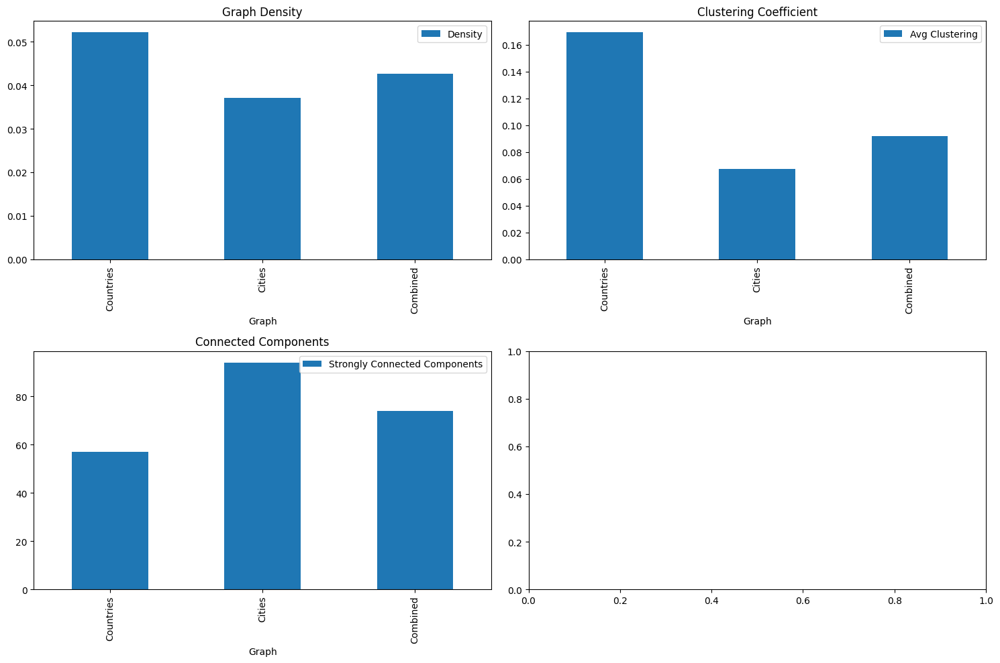

In [13]:
# Plot metric comparisons
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
metrics_df.plot.bar(x='Graph', y='Density', ax=axes[0,0], title='Graph Density')
metrics_df.plot.bar(x='Graph', y='Avg Clustering', ax=axes[0,1], title='Clustering Coefficient')
metrics_df.plot.bar(x='Graph', y='Strongly Connected Components', ax=axes[1,0], title='Connected Components')
plt.tight_layout()
plt.savefig('../outputs/graphs/metric_comparison.png')

## PyVis 3D Visualisations

In [14]:
from pyvis.network import Network
import jinja2
import webbrowser
import networkx as nx

def pyvis_visualization(graph, html_filename, graphml_filename):
    # pyvis network with full-screen dimensions
    net = Network(height="100vh", width="100vw", bgcolor="#222222", font_color="white")
    
    # converting networkx graph to pyvis
    net.from_nx(graph)
    
    # manually load Jinja2 template cuz some issue in autoloading
    template_loader = jinja2.PackageLoader('pyvis', 'templates')
    template_env = jinja2.Environment(loader=template_loader)
    net.template = template_env.get_template("template.html")
    
    # physics options for better animation and a globe view
    net.set_options("""
    var options = {
      "physics": {
        "forceAtlas2Based": {
          "gravitationalConstant": -50,
          "centralGravity": 0.01,
          "springLength": 100,
          "springConstant": 0.08
        },
        "minVelocity": 0.75,
        "solver": "forceAtlas2Based"
      }
    }
    """)

    # save as GraphML file for dashboard
    nx.write_graphml(graph, graphml_filename)

    net.show(html_filename)
    webbrowser.open(html_filename)

# Visualize using PyVis for all three graphs:
pyvis_visualization(country_graph, "country_graph_pyvis.html", "country_graph.graphml")
pyvis_visualization(city_graph, "city_graph_pyvis.html", "city_graph.graphml")
pyvis_visualization(combined_graph, "combined_graph_pyvis.html", "combined_graph.graphml")


country_graph_pyvis.html
city_graph_pyvis.html
combined_graph_pyvis.html


### Strategic Analysis

In [15]:
def strategic_analysis(graph, name):
    degree = nx.degree_centrality(graph)
    betweenness = nx.betweenness_centrality(graph)
    pagerank = nx.pagerank(graph)
    
    # top strategic nodes
    top_degree = sorted(degree.items(), key=lambda x: x[1], reverse=True)[:3]
    top_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:3]
    top_pagerank = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:3]
    
    print(f"\n--- {name} Graph Strategy ---")
    print("High Out-Degree Nodes:", top_degree)
    print("Bottleneck Nodes:", top_betweenness)
    print("PageRank Influencers:", top_pagerank)

strategic_analysis(country_graph, "Country")
strategic_analysis(city_graph, "City")
strategic_analysis(combined_graph, "Combined")


--- Country Graph Strategy ---
High Out-Degree Nodes: [('ARGENTINA', 0.3588709677419355), ('ANDORRA', 0.3588709677419355), ('ANGUILLA', 0.3588709677419355)]
Bottleneck Nodes: [('AZERBAIJAN', 0.11492999108519981), ('AFGHANISTAN', 0.11492999108519981), ('NAURU', 0.1005117362011292)]
PageRank Influencers: [('AZERBAIJAN', 0.034422847509337114), ('AFGHANISTAN', 0.034422847509337114), ('ARGENTINA', 0.03245282506942813)]

--- City Graph Strategy ---
High Out-Degree Nodes: [('AD-DAMMAM', 0.2545090180360721), ('AMSTERDAM', 0.2545090180360721), ('ATHENS', 0.24849699398797592)]
Bottleneck Nodes: [('GAZIANTEP', 0.07015303100759909), ('KARAJ', 0.03413252207225696), ('NASHIK', 0.033887047492339915)]
PageRank Influencers: [('URUMQI', 0.016972054941315505), ('ULAANBAATAR', 0.016972054941315505), ('UYO', 0.016972054941315505)]

--- Combined Graph Strategy ---
High Out-Degree Nodes: [('ATHENS', 0.3096514745308311), ('ALGIERS', 0.3096514745308311), ('AGUASCALIENTES', 0.3096514745308311)]
Bottleneck Node

### Letter Frequency and Longest Path Analysis

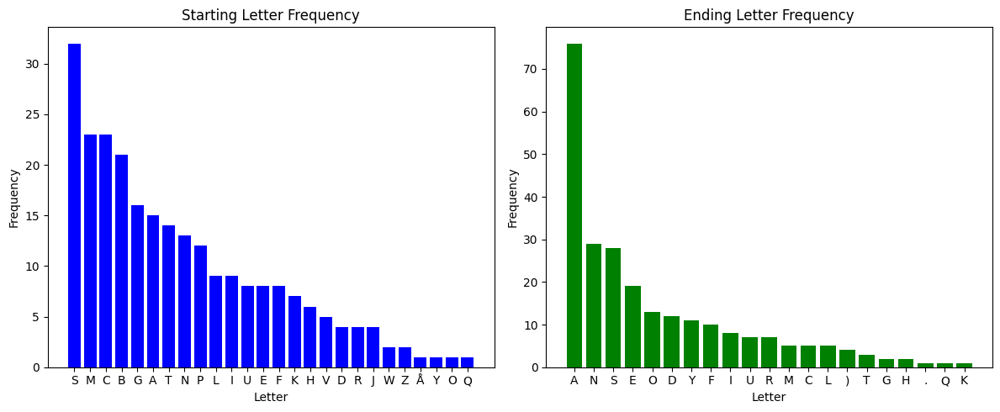

Longest path from AFGHANISTAN : ['AFGHANISTAN', 'NICARAGUA', 'ARGENTINA', 'ANDORRA', 'ANGUILLA', 'AUSTRIA', 'ALGERIA', 'AMERICAN SAMOA']


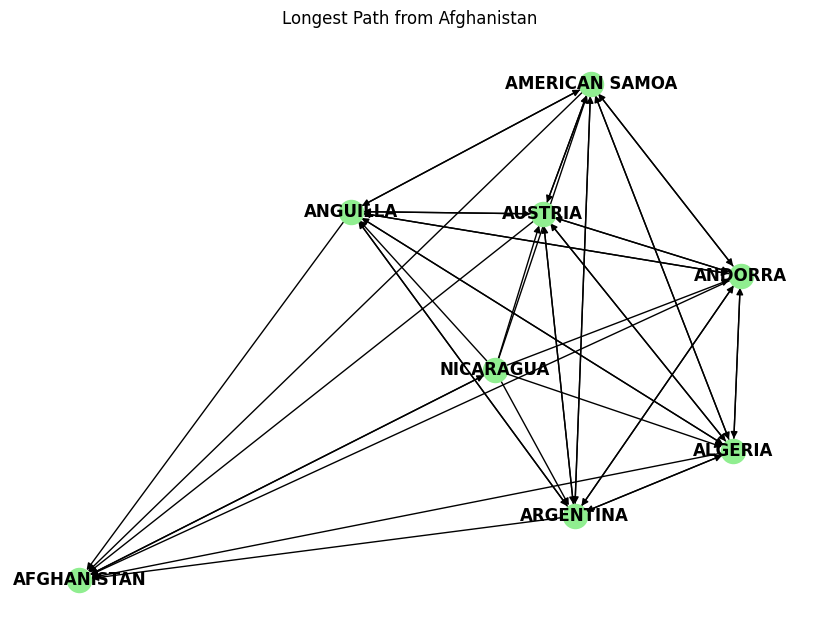

In [16]:
import matplotlib.pyplot as plt
import pandas as pd

nodes = list(country_graph.nodes())
start_letters = [n[0] for n in nodes if n]
end_letters = [n[-1] for n in nodes if n]

# Sorted letter frequency
start_freq = pd.Series(start_letters).value_counts().sort_values(ascending=False)
end_freq = pd.Series(end_letters).value_counts().sort_values(ascending=False)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.bar(start_freq.index, start_freq.values, color='blue')
plt.title("Starting Letter Frequency")
plt.xlabel("Letter")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.bar(end_freq.index, end_freq.values, color='green')
plt.title("Ending Letter Frequency")
plt.xlabel("Letter")
plt.ylabel("Frequency")

plt.tight_layout()
plt.savefig("../outputs/graphs/letter_frequency.png", dpi=300)
plt.show()

# Revised Longest Path using DFS with a cutoff to avoid long runtime
def longest_simple_path_dfs(graph, start, max_depth=7):
    longest = []
    def dfs(node, path, depth):
        nonlocal longest
        if depth > max_depth:
            return
        if len(path) > len(longest):
            longest = path.copy()
        for neighbor in graph.successors(node):
            if neighbor not in path:
                path.append(neighbor)
                dfs(neighbor, path, depth + 1)
                path.pop()
    dfs(start, [start], 0)
    return longest

node_to_explore = "AFGHANISTAN"  # ensure lowercase if graph nodes are lowercase
longest_path = longest_simple_path_dfs(country_graph, node_to_explore, max_depth=7)
print("Longest path from", node_to_explore, ":", longest_path)

if longest_path:
    subG = country_graph.subgraph(longest_path)
    pos = nx.spring_layout(subG)
    plt.figure(figsize=(8, 6))
    nx.draw(subG, pos, with_labels=True, node_color='lightgreen', edge_color='black', font_weight='bold')
    plt.title("Longest Path from " + node_to_explore.capitalize())
    plt.savefig("../outputs/graphs/longest_path.png", dpi=300)
    plt.show()


## ATLAS Game Simulation

In [17]:
import random

def get_valid_moves(graph, current, visited):
    """Return valid successors of current that have not been visited."""
    return [n for n in graph.successors(current) if n not in visited]

# Random strategy move: simply chooses a random valid move.
def random_move(graph, current, visited):
    moves = get_valid_moves(graph, current, visited)
    return random.choice(moves) if moves else None

# Letter Gap Strategy move:
# For each valid move, we look at its last letter and choose the move for which the number 
# of nodes starting with that letter (in the full graph) is minimal.
def letter_gap_move(graph, current, visited, start_counts):
    moves = get_valid_moves(graph, current, visited)
    if not moves:
        return None
    # For each candidate move, get its last letter and then fetch the number of nodes starting with that letter.
    best_move = min(moves, key=lambda m: start_counts.get(m[-1], 0))
    return best_move

def compute_start_counts(graph):
    """Precompute a dictionary: letter -> count of nodes that start with that letter."""
    counts = {}
    for node in graph.nodes():
        letter = node[0]
        counts[letter] = counts.get(letter, 0) + 1
    return counts

# Turn-based game simulation between two strategies.
# Each strategy is a function taking (graph, current, visited, start_counts) and returning a move.
def simulate_turn_based_game(graph, strat_func1, strat_func2, start_counts, starting_player=1, verbose=False):
    current = random.choice(list(graph.nodes()))
    visited = {current}
    if verbose:
        print(f"Starting node: {current}")
    turn = starting_player  # 1 or 2
    while True:
        if turn == 1:
            move = strat_func1(graph, current, visited, start_counts)
        else:
            move = strat_func2(graph, current, visited, start_counts)
        if move is None:
            if verbose:
                print(f"Player {turn} cannot move. Winner: Player {3 - turn}")
            return 3 - turn  # The other player wins
        if verbose:
            print(f"Player {turn} chooses: {move}")
        current = move
        visited.add(current)
        turn = 1 if turn == 2 else 2  # switch turns

# Define strategy wrappers to match the required signature.
def random_strategy(graph, current, visited, start_counts):
    return random_move(graph, current, visited)

def letter_gap_strategy(graph, current, visited, start_counts):
    return letter_gap_move(graph, current, visited, start_counts)

# Simulate multiple turn-based games between Random and Letter Gap strategies.
def simulate_turn_based_games(graph, num_games=100, verbose=False):
    start_counts = compute_start_counts(graph)
    wins_random = 0
    wins_letter_gap = 0
    for i in range(num_games):
        # Randomly decide which strategy starts.
        starting_player = random.choice([1, 2])
        if starting_player == 1:
            winner = simulate_turn_based_game(graph, random_strategy, letter_gap_strategy, start_counts, starting_player=1, verbose=False)
            if winner == 1:
                wins_random += 1
            else:
                wins_letter_gap += 1
        else:
            winner = simulate_turn_based_game(graph, letter_gap_strategy, random_strategy, start_counts, starting_player=1, verbose=False)
            if winner == 1:
                wins_letter_gap += 1
            else:
                wins_random += 1
    print(f"Turn-based simulation over {num_games} games:")
    print(f"Random Strategy wins: {wins_random} ({wins_random/num_games*100:.1f}%)")
    print(f"Letter Gap Strategy wins: {wins_letter_gap} ({wins_letter_gap/num_games*100:.1f}%)")
    
simulate_turn_based_games(country_graph, num_games=100, verbose=True)


Turn-based simulation over 100 games:
Random Strategy wins: 9 (9.0%)
Letter Gap Strategy wins: 91 (91.0%)


# Task 2 - Community Detection

In [169]:
import community as louvain_community
from networkx.algorithms.community import girvan_newman, modularity

# convert country graph to undirected
G_undirected = country_graph.to_undirected()

# Louvain method
partition_louvain = louvain_community.best_partition(G_undirected)
communities_louvain = {}
for node, comm_id in partition_louvain.items():
    communities_louvain.setdefault(comm_id, []).append(node)
modularity_louvain = louvain_community.modularity(partition_louvain, G_undirected)
print(f"Louvain: Found {len(communities_louvain)} communities. Modularity: {modularity_louvain:.4f}")

# Girvan-Newman method
communities_gn_generator = girvan_newman(G_undirected)
best_partition_gn = None
max_modularity_gn = -1
max_iter = 15  # check how many iterations goves best result
for i, partition in enumerate(communities_gn_generator):
    if i >= max_iter:
        break
    current_modularity = modularity(G_undirected, partition)
    if current_modularity > max_modularity_gn:
        max_modularity_gn = current_modularity
        best_partition_gn = partition

# convert partition to dictionary
partition_gn = {}
for comm_id, comm in enumerate(best_partition_gn):
    for node in comm:
        partition_gn[node] = comm_id
print(f"Girvan-Newman: Found {len(best_partition_gn)} communities. Best Modularity: {max_modularity_gn:.4f}")

Louvain: Found 6 communities. Modularity: 0.4633
Girvan-Newman: Found 8 communities. Best Modularity: 0.0026


C:\Users\athar\AppData\Local\Temp\ipykernel_17508\4254868203.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



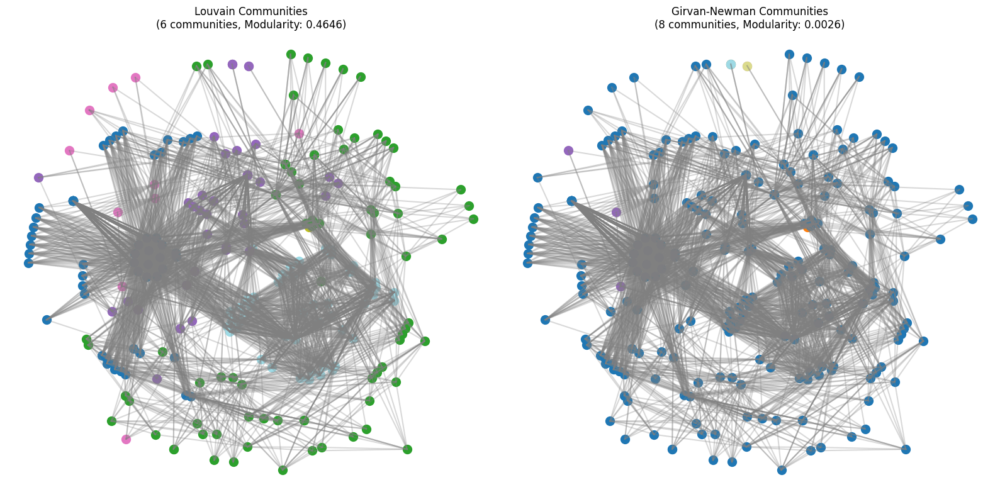

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def draw_communities(G, partition, title, ax):
    num_communities = max(partition.values()) + 1
    cmap = cm.get_cmap('tab20', num_communities)
    # community colors
    for node in G.nodes():
        ax.scatter(*pos[node], color=cmap(partition[node]), s=100)
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        ax.plot([x0, x1], [y0, y1], color='gray', alpha=0.3)
    ax.set_title(title)
    ax.axis('off')

pos = nx.kamada_kawai_layout(country_graph)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
draw_communities(country_graph, partition_louvain, f"Louvain Communities\n({len(communities_louvain)} communities, Modularity: {modularity_louvain:.4f})", axes[0])
draw_communities(country_graph, partition_gn, f"Girvan-Newman Communities\n({len(best_partition_gn)} communities, Modularity: {max_modularity_gn:.4f})", axes[1])
plt.tight_layout()
plt.savefig("../outputs/graphs/community_comparison.png", dpi=300)
plt.show()


In [ ]:
from pycountry_convert import country_alpha2_to_continent_code

def get_continent(code):
    try:
        return country_alpha2_to_continent_code(code)
    except:
        return 'Unknown'
countries_df['Continent'] = countries_df['Code'].apply(get_continent)
country_to_continent = dict(zip(countries_df['Name'].str.upper(), countries_df['Continent']))

def analyze_community(community_nodes):
    from collections import defaultdict
    continent_counts = defaultdict(int)
    for node in community_nodes:
        continent = country_to_continent.get(node, 'Unknown')
        continent_counts[continent] += 1
    return dict(continent_counts)

print("Louvain Communities Composition:")
for comm_id, nodes in communities_louvain.items():
    print(f"Community {comm_id} ({len(nodes)} nodes): {analyze_community(nodes)}")

print("\nGirvan-Newman Communities Composition:")
for comm_id, nodes in partition_gn.items():
    # build dictionary of nodes per community
    pass  # instead, aggregate below:
gn_communities = {}
for node, comm_id in partition_gn.items():
    gn_communities.setdefault(comm_id, []).append(node)
for comm_id, nodes in gn_communities.items():
    print(f"Community {comm_id} ({len(nodes)} nodes): {analyze_community(nodes)}")


Louvain Communities Composition:
Community 0 (60 nodes): {'OC': 6, 'AF': 14, 'SA': 4, 'EU': 10, 'NA': 13, 'AS': 11, 'Unknown': 2}
Community 1 (81 nodes): {'NA': 10, 'AF': 22, 'EU': 17, 'SA': 7, 'AS': 15, 'OC': 8, 'AN': 1, 'Unknown': 1}
Community 2 (42 nodes): {'AS': 16, 'AF': 8, 'NA': 2, 'OC': 6, 'Unknown': 2, 'SA': 2, 'EU': 6}
Community 3 (11 nodes): {'EU': 5, 'NA': 2, 'Unknown': 1, 'AF': 1, 'AS': 2}
Community 5 (54 nodes): {'AS': 9, 'EU': 12, 'NA': 12, 'AF': 11, 'Unknown': 3, 'SA': 2, 'OC': 4, 'AN': 1}
Community 4 (1 nodes): {'NA': 1}

Girvan-Newman Communities Composition:
Community 0 (239 nodes): {'OC': 24, 'AF': 55, 'NA': 37, 'AS': 51, 'EU': 48, 'SA': 14, 'Unknown': 8, 'AN': 2}
Community 1 (1 nodes): {'NA': 1}
Community 2 (1 nodes): {'AS': 1}
Community 3 (4 nodes): {'AS': 1, 'NA': 1, 'EU': 1, 'Unknown': 1}
Community 4 (1 nodes): {'NA': 1}
Community 5 (1 nodes): {'SA': 1}
Community 6 (1 nodes): {'AF': 1}
Community 7 (1 nodes): {'EU': 1}


In [69]:
import random
import webbrowser
from pyvis.network import Network
import jinja2

def pyvis_visualization(graph, html_filename, graphml_filename, partition=None):
    net = Network(height="100vh", width="100vw", bgcolor="#222222", font_color="white")
    net.from_nx(graph)

    # community colors
    if partition:
        community_ids = list(set(partition.values()))
        colors = [f'#{random.randint(0, 0xFFFFFF):06x}' for _ in community_ids]
        for node in net.nodes:
            if 'id' in node:  # ensuring node ID exists before accessing it
                node['color'] = colors[partition[node['id']] % len(colors)]

    template_loader = jinja2.PackageLoader('pyvis', 'templates')
    template_env = jinja2.Environment(loader=template_loader)
    net.template = template_env.get_template("template.html")

    # save as graphML file for dashboard
    import networkx as nx
    nx.write_graphml(graph, graphml_filename)
    net.show(html_filename)
    webbrowser.open(html_filename)

pyvis_visualization(G_undirected, "country_louvain.html", "country_graph.graphml", partition_louvain)
pyvis_visualization(G_undirected, "country_gn.html", "country_graph.graphml", partition_gn)


country_louvain.html
country_gn.html


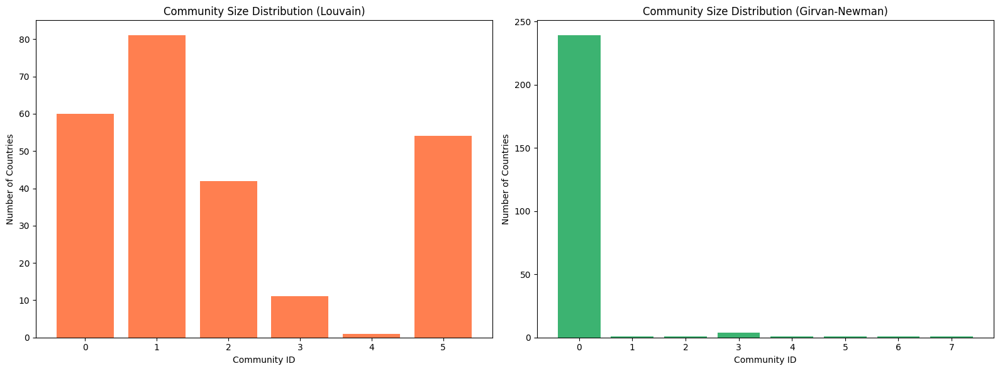

In [70]:
# Louvain Community Size Distribution
louvain_sizes = {comm: len(nodes) for comm, nodes in communities_louvain.items()}
# Girvan-Newman Community Size Distribution
gn_sizes = {comm: len(nodes) for comm, nodes in gn_communities.items()}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
ax1.bar(louvain_sizes.keys(), louvain_sizes.values(), color='coral')
ax1.set_xlabel("Community ID")
ax1.set_ylabel("Number of Countries")
ax1.set_title("Community Size Distribution (Louvain)")

ax2.bar(gn_sizes.keys(), gn_sizes.values(), color='mediumseagreen')
ax2.set_xlabel("Community ID")
ax2.set_ylabel("Number of Countries")
ax2.set_title("Community Size Distribution (Girvan-Newman)")

plt.tight_layout()
plt.savefig("../outputs/graphs/community_sizes_comparison.png", dpi=300)
plt.show()


In [ ]:
def semantic_cluster(names):
    # cluster country names semantically based on common linguistic suffixes (case-insensitive)
    clusters = {"-stan": [], "-land": [], "-ia": [], "others": []}
    for name in names:
        lower = name.lower()
        if lower.endswith("stan"):
            clusters["-stan"].append(name)
        elif lower.endswith("land"):
            clusters["-land"].append(name)
        elif lower.endswith("ia"):
            clusters["-ia"].append(name)
        else:
            clusters["others"].append(name)
    return clusters

semantic_clusters = semantic_cluster(list(G_undirected.nodes()))
print("Semantic Clusters:", {k: len(v) for k, v in semantic_clusters.items()})

Semantic Clusters: {'-stan': 7, '-land': 11, '-ia': 34, 'others': 197}


In [ ]:
def compute_bridge_nodes(G, threshold=0.05):
    betweenness = nx.betweenness_centrality(G)
    bridge_nodes = [node for node, val in betweenness.items() if val > threshold]
    top_bridges = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:10]
    return bridge_nodes, top_bridges

bridge_nodes, top_bridges = compute_bridge_nodes(G_undirected, threshold=0.05)
print("Bridge Nodes (threshold 0.05):", bridge_nodes)
print("Top 10 Bridge Nodes (by betweenness):", top_bridges)


Bridge Nodes (threshold 0.05): []
Top 10 Bridge Nodes (by betweenness): [('YEMEN', 0.044586089870131344), ('OMAN', 0.04008207368192133), ('AZERBAIJAN', 0.03346259884174071), ('AFGHANISTAN', 0.03346259884174071), ('SYRIAN ARAB REPUBLIC', 0.02700681168875112), ('NETHERLANDS', 0.024573972105148178), ('NORTHERN MARIANA ISLANDS', 0.024573972105148178), ('NIUE', 0.02360642318471146), ('DOMINICA', 0.023200969232291768), ('EGYPT', 0.022753400128910087)]


In [ ]:
import random
print(f"Original Louvain Modularity: {modularity_louvain:.4f}")
G_perturbed = G_undirected.copy()
edges_to_remove = random.sample(list(G_perturbed.edges()), int(0.5 * G_perturbed.number_of_edges()))
G_perturbed.remove_edges_from(edges_to_remove)
partition_perturbed = louvain_community.best_partition(G_perturbed)
mod_perturbed = louvain_community.modularity(partition_perturbed, G_perturbed)
print(f"Perturbed Louvain Modularity: {mod_perturbed:.4f}")


Original Louvain Modularity: 0.4646
Perturbed Louvain Modularity: 0.4708


In [168]:
def community_centric_strategies(G, partition):
    # For each community, compute the internal density (ratio of internal edges to maximum possible edges). 
    # Returns a dictionary mapping community id to its internal density.
    
    communities = {}
    for node, comm in partition.items():
        communities.setdefault(comm, []).append(node)
    density_info = {}
    for comm, nodes in communities.items():
        subG = G.subgraph(nodes)
        n = len(nodes)
        if n > 1:
            max_possible = n * (n - 1) / 2
            actual = subG.number_of_edges()
            density_info[comm] = actual / max_possible
        else:
            density_info[comm] = 0
    return density_info

def cultural_economic_correlations(cities_df, partition):
    # average population per community.
    df = cities_df.copy()
    df['Name_upper'] = df['city'].str.upper()
    df['Community'] = df['Name_upper'].apply(lambda x: partition.get(x.lower(), -1))
    pop_by_comm = df.groupby('Community')['population'].mean().to_dict()
    return pop_by_comm

density_info = community_centric_strategies(G_undirected, partition_louvain)
print("Community Internal Densities:", density_info)

pop_by_comm = cultural_economic_correlations(cities_df, partition_louvain)
print("Average Population by Community:", pop_by_comm)


Community Internal Densities: {0: 0.4401129943502825, 1: 0.1169753086419753, 2: 0.31010452961672474, 3: 0.2909090909090909, 5: 0.5932914046121593, 4: 0}
Average Population by Community: {-1: 3682046.701195219}
